## Introduction

There are many methods for calculating the wet bulb temperature like one-third rule and Stull's empirical formula, but the most accurate of them all is Normand's rule. The drawback to using Normand's rule is that it requires an iterative process to converge onto the solution and cannot be applied in a vectorized way which can lead to significant compute time if the array length is long. Here I explore deriving wet bulb temperatures using both a linear regression and a deep learning method, benchmarking against the other methods--treating Normand's rule as ground truth. I will be using NCEP Reanalysis to train and test my model and KMRY station timeseries for validation.

## Reference Links
Two Simple and Accurate Approximations for Wet-Bulb Temperature in Moist Conditions, with Forecasting Applications (Knox, 2017) :<br>
https://journals.ametsoc.org/doi/10.1175/BAMS-D-16-0246.1

Wet-Bulb Temperature from Relative Humidity and Air Temperature (Stull, 2011):<br>https://journals.ametsoc.org/doi/full/10.1175/JAMC-D-11-0143.1

MetPy's implementation of Normand's rule:<br>https://unidata.github.io/MetPy/latest/_modules/metpy/calc/thermo.html#wet_bulb_temperature

Repo:
https://github.com/ahuang11/deriving_wetbulb

Interactive Notebook:
https://anaconda.org/ahuang11/wet_bulb_temperature/notebook

## Preview of the Results

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
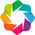

correlation


stull      0.998745
half       0.998483
third      0.998009
lreg       0.998683
keras      0.999948
normand    1.000000
Name: normand, dtype: float64

sum of absolute bias


stull_bias     4232.213127
half_bias      8930.019910
third_bias    12305.923416
lreg_bias      6098.846384
keras_bias     1830.677383
dtype: float64

average of absolute bias


stull_bias    0.344755
half_bias     0.727437
third_bias    1.002438
lreg_bias     0.496811
keras_bias    0.149127
dtype: float64

:NdLayout   [Default]
   :HoloMap   [season]
      :Overlay
         .QuadMesh.I  :QuadMesh   [lon,lat]   (third_bias)
         .Coastline.I :Feature   [Longitude,Latitude]

In [51]:
hv.extension('bokeh')
# we see that the half method and one-third rule tend to overestimate
# the wet bulb temperature within the Tropics; lreg (linear regression)
# has similar biases with the half method, but less; Stull's method
# does well across except the poles, the keras (deep learning) model
# exhibits almost no bias across
print('correlation')
df_test[methods + ['normand']].corr()['normand']
print('sum of absolute bias')
df_test.filter(regex='bias').abs().sum()
print('average of absolute bias')
df_test.filter(regex='bias').abs().mean()
wtb_maps

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
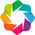

In [24]:
import os

# use metpy's implementation of Normand's rule
from metpy.calc import wet_bulb_temperature, dewpoint_rh
from metpy.units import units

# use scikit-learn for machine learning utilities and linear regression
# yellowbrick for visualizing the errors of the linear regression
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from yellowbrick.regressor import ResidualsPlot

# use kera with tensorflow backend for deep learning
from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasRegressor

# xarray for reading in gridded netcdf; numpy and pandas for data wrangling
# holoviews, hvplot, geoviews for visualization; cartopy for projections
import xarray as xr
import numpy as np
import pandas as pd
import holoviews as hv
import hvplot.xarray
import hvplot.pandas
import geoviews as gv
import cartopy.crs as ccrs
hv.extension('bokeh')
hv.renderer('bokeh').theme = 'caliber'

In [5]:
def stull_wtb(tmp, rlh):
    # https://journals.ametsoc.org/doi/full/10.1175/JAMC-D-11-0143.1
    term1_stull = tmp * np.arctan(0.151977 * np.sqrt(rlh + 8.313659))
    term2_stull = np.arctan(tmp + rlh)
    term3_stull = np.arctan(rlh - 1.676331)
    term4_stull = 0.00391838 * np.power(rlh, 1.5) * np.arctan(0.023101 * rlh)
    term5_stull = 4.686035
    return term1_stull + term2_stull - term3_stull + term4_stull - term5_stull

def half_wtb(tmp, dpt):
    # https://journals.ametsoc.org/doi/10.1175/BAMS-D-16-0246.1
    return 0.5 * (tmp + dpt)

def third_wtb(tmp, dpt):
    # https://journals.ametsoc.org/doi/10.1175/BAMS-D-16-0246.1
    return 2 / 3 * tmp + 1 / 3 * dpt

def _try_normand_wtb(s, t, d):
    # wrapper for metpy's implementation for cases where it doesn't converge
    # onto a solution (exceeds max iteration) so just return NaN
    try:
        return wet_bulb_temperature(
            np.array([s]) * units('hPa'),
            np.array([t]) * units('degC'),
            np.array([d]) * units('degC')
        ).m
    except:
        return np.nan

def normand_wtb(slp, tmp, dpt):
    # a wrapper of a wrapper
    return np.array(
        [_try_normand_wtb(s, t, d)
         for s, t, d in zip(slp, tmp, dpt)]
    )

def normand_wtb_ds(ds):
    # a wrapper of a wrapper of a wrapper to handle xr.Dataset
    ds['normand'] = (
        ['time', 'lat', 'lon'],
        np.array(normand_wtb(
            ds['slp'].values.ravel(),
            ds['tmp'].values.ravel(),
            ds['dpt'].values.ravel()
        )).reshape(ds['tmp'].shape)
    )
    return ds

In [ ]:
# retrieve surface air temperature and relative humidity, sea level pressure
!wget -nc ftp://ftp.cdc.noaa.gov/Datasets/ncep.reanalysis/surface/air.sig995.2018.nc
!wget -nc ftp://ftp.cdc.noaa.gov/Datasets/ncep.reanalysis/surface/slp.2018.nc
!wget -nc ftp://ftp.cdc.noaa.gov/Datasets/ncep.reanalysis/surface/rhum.sig995.2018.nc

In [6]:
# read in the datasets and prepare dataset for input to methods
# such as calculating dewpoint and converting units
ds = xr.open_mfdataset([
    'air.sig995.2018.nc',
    'rhum.sig995.2018.nc',
    'slp.2018.nc'
]).rename({'air': 'tmp', 'rhum': 'rlh'}).load()

ds['dpt'] = (['time', 'lat', 'lon'],
             dewpoint_rh(ds['tmp'].values * units('degK'),
                         ds['rlh'].values / 100).m)
ds['tmp'].data = (ds['tmp'].values * units('degK')).to('degC').m
ds['slp'].data = (ds['slp'].values * units('Pa')).to('hPa').m

File ‘air.sig995.2018.nc’ already there; not retrieving.
File ‘slp.2018.nc’ already there; not retrieving.
File ‘rhum.sig995.2018.nc’ already there; not retrieving.


/home/solactus/anaconda3/lib/python3.6/site-packages/pint/quantity.py:1488: RuntimeWarning: divide by zero encountered in log
  return ufunc(*mobjs)
/home/solactus/anaconda3/lib/python3.6/site-packages/pint/quantity.py:888: RuntimeWarning: invalid value encountered in true_divide
  magnitude = magnitude_op(new_self._magnitude, other._magnitude)


In [7]:
# subset to every 10 degrees latitudinally and longitudinally and 
# every 10th and 20th day of each month of the year, 4 times a day,
# because it literally takes hours to calculate the wet bulb temperature
# on a gridded dataset with Normand's method (built-in loop / trial and error)
ds_sub = ds.sel(time=ds['time.day'].isin([10, 20]),
                lat=ds['lat'][::4],
                lon=ds['lon'][::4]
                )

In [ ]:
# calculate the wet bulb temperature with four methods
# ds_sub_wtb = normand_wtb_ds(ds_sub)
# ds_sub_wtb['stull'] = stull_wtb(ds_sub_wtb['tmp'], ds_sub_wtb['rlh'])
# ds_sub_wtb['half'] = half_wtb(ds_sub_wtb['tmp'], ds_sub_wtb['dpt'])
# ds_sub_wtb['third'] = third_wtb(ds_sub_wtb['tmp'], ds_sub_wtb['dpt'])

# export the calculations so in case I need to restart my kernel,
# I don't have to wait another couple hours for it to finish
# ds_sub_wtb.to_netcdf('output_ds_10deg.nc')

# load in pre-calculated wet bulb temperatures
ds_sub_wtb = xr.open_dataset('output_ds_10deg.nc')

In [21]:
# convert the dataset to something more easier to use in the models
df_sub_wtb = ds_sub_wtb.to_dataframe().reset_index().dropna()

# through trial and error and a bit of physical intuition, I found that
# adding these additional columns features help the deep learning model
df_sub_wtb = df_sub_wtb.assign(**{
    'hour': df_sub_wtb['time'].dt.hour,
    'year': df_sub_wtb['time'].dt.year,
    'month': df_sub_wtb['time'].dt.month,
    'dayofyear': df_sub_wtb['time'].dt.dayofyear
})
df_sub_wtb['ddp'] = df_sub_wtb['tmp'] - df_sub_wtb['dpt']
df_sub_wtb['latxlon'] = df_sub_wtb['lat'] * df_sub_wtb['lon']

In [9]:
# select the features I want to use to train my models
features = ['lat', 'lon', 'year', 'month', 'dayofyear', 'hour',
            'slp', 'tmp', 'dpt', 'rlh', 'ddp', 'latxlon']
X = df_sub_wtb[features]

# select the "ground truth"
targets = ['normand']
y = df_sub_wtb[targets[0]]

# create training and test sets
# use 80 percent to train and 20 percent to test
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2
)

In [11]:
# here's what the training feature and target dataframes look like
X_train.head()
y_train.head()

,lat,lon,year,month,dayofyear,hour,slp,tmp,dpt,rlh,ddp,latxlon
23428,30.0,280.0,2018,1,20,0,1024.0,13.4375,5.843502,60.0,7.593998,8400.0
46014,-40.0,110.0,2018,4,110,12,992.0,14.7500,11.336850,80.0,3.413150,-4400.0
49514,-50.0,110.0,2018,10,283,12,1008.0,4.8750,4.116865,95.0,0.758135,-5500.0
33376,0.0,230.0,2018,9,253,0,1008.0,24.9375,20.216558,75.0,4.720942,0.0
53047,-60.0,120.0,2018,7,201,18,968.0,2.1250,1.432714,95.0,0.692286,-7200.0


23428     9.431349
46014    12.704603
49514     4.501589
33376    21.571770
53047     1.831451
Name: normand, dtype: float64

ResidualsPlot(alpha=0.75,
       ax=<matplotlib.axes._subplots.AxesSubplot object at 0x7f6a8417c048>,
       hist=True, line_color=None, model=None, test_color=None,
       train_color=None)

/home/solactus/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


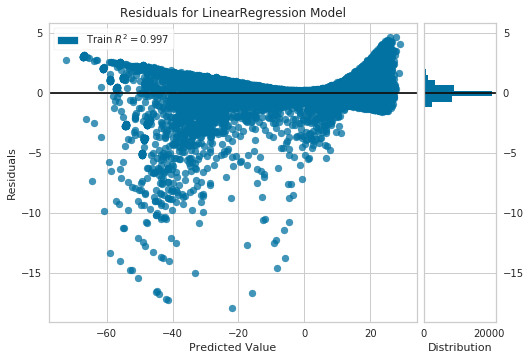

In [10]:
# fit the linear regression model and visualize where the errors are from
visualizer = ResidualsPlot(LinearRegression())
visualizer.fit(X_train, y_train)
visualizer.poof()

In [16]:
def baseline_model():
    # 12 nodes -> 6 nodes -> 1 node
    # through trial and error by adding nodes, removing layers, and
    # changing epochs based on where I see the loss asymptote
    model = Sequential()
    model.add(Dense(12, input_dim=12,
                    kernel_initializer='normal',
                    activation='relu'))
    model.add(Dense(6, input_dim=12,
                    kernel_initializer='normal',
                    activation='relu'))
    model.add(Dense(1, kernel_initializer='normal'))
    model.compile(loss='mean_squared_error', optimizer='adam')
    return model

estimator = KerasRegressor(build_fn=baseline_model, epochs=28)
estimator.fit(X_train, y_train)

Epoch 1/28
49104/49104 [==============================] - 1s 20us/step - loss: 57.9878
Epoch 2/28
49104/49104 [==============================] - 1s 17us/step - loss: 1.8804
Epoch 3/28
49104/49104 [==============================] - 1s 16us/step - loss: 1.4498
Epoch 4/28
49104/49104 [==============================] - 1s 17us/step - loss: 0.9518
Epoch 5/28
49104/49104 [==============================] - 1s 16us/step - loss: 0.7171
Epoch 6/28
49104/49104 [==============================] - 1s 17us/step - loss: 0.3756
Epoch 7/28
49104/49104 [==============================] - 1s 16us/step - loss: 0.3705
Epoch 8/28
49104/49104 [==============================] - 1s 16us/step - loss: 0.2537
Epoch 9/28
49104/49104 [==============================] - 1s 17us/step - loss: 0.3327
Epoch 10/28
49104/49104 [==============================] - 1s 16us/step - loss: 0.2071
Epoch 11/28
49104/49104 [==============================] - 1s 17us/step - loss: 0.1968
Epoch 12/28
49104/49104 [==========================

In [30]:
# create a dataframe containing the results from all the methods
df_test = (X_test.join(df_sub_wtb[['normand', 'stull', 'half', 'third']])
           .assign(**{'lreg': visualizer.predict(X_test),
                      'keras': estimator.predict(X_test)}))
df_test['time'] = pd.to_datetime(df_test['year'].astype(str) +
                                 df_test['dayofyear'].astype(str) +
                                 df_test['hour'].astype(str),
                                 format='%Y%j%H')
df_test = df_test.set_index(['time', 'lat', 'lon'])

# calculate the bias for each method against Normand's rule
methods = ['stull', 'half', 'third', 'lreg', 'keras']
for var in methods:
    bias_var = '{0}_bias'.format(var)
    df_test[bias_var] = df_test['normand'] - df_test[var]

# calculate the correlation and absolute bias for each method
# all of them have very high correlation, but the keras method
# results in the smallest absolute bias, averaging 0.149127 per point
print('correlation')
df_test[methods + ['normand']].corr()['normand']
print('sum of absolute bias')
df_test.filter(regex='bias').abs().sum()
print('average of absolute bias')
df_test.filter(regex='bias').abs().mean()

correlation


stull      0.998745
half       0.998483
third      0.998009
lreg       0.998683
keras      0.999948
normand    1.000000
Name: normand, dtype: float64

sum of absolute bias


stull_bias     4232.213127
half_bias      8930.019910
third_bias    12305.923416
lreg_bias      6098.846384
keras_bias     1830.677383
dtype: float64

average of absolute bias


stull_bias    0.344755
half_bias     0.727437
third_bias    1.002438
lreg_bias     0.496811
keras_bias    0.149127
dtype: float64

In [23]:
# convert the dataframe into a dataset to plot onto a map
ds_test = df_test.sort_index().to_xarray()

# group by season to summarize the results
ds_test_mn = ds_test.groupby('time.season').mean('time')

# create the maps
wtb_maps = gv.NdLayout({
    bias_var:
        ds_test_mn[bias_var].hvplot.quadmesh(
            'lon', 'lat', groupby='season', dynamic=False,
            clim=(-4, 4), crs=ccrs.PlateCarree())
        .opts(projection=ccrs.Robinson(), cmap='RdBu_r',
              clipping_colors={'NaN': 'lightgray'}) *
        gv.feature.coastline
    for bias_var in [f'{var}_bias' for var in methods]
}).cols(1)

# show the map
# we see that the half method and one-third rule tend to overestimate
# the wet bulb temperature within the Tropics; lreg (linear regression)
# has similar biases with the half method, but less; Stull's method
# does well across except the poles, the keras (deep learning) model
# exhibits almost no bias across
wtb_maps

/home/solactus/anaconda3/lib/python3.6/site-packages/xarray/core/nanops.py:161: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


:NdLayout   [Default]
   :HoloMap   [season]
      :Overlay
         .QuadMesh.I  :QuadMesh   [lon,lat]   (third_bias)
         .Coastline.I :Feature   [Longitude,Latitude]

In [32]:
# validate against a timeseries from KMRY
# url = 'https://mesonet.agron.iastate.edu/cgi-bin/request/asos.py?station=MRY&data=tmpc&data=dwpc&data=relh&data=mslp&year1=2015&month1=1&day1=1&year2=2019&month2=2&day2=14&tz=Etc%2FUTC&format=onlycomma&latlon=no&missing=M&trace=T&direct=no&report_type=1&report_type=2'
# df = pd.read_csv(url, index_col='valid', parse_dates=True)
# df = df.replace('M', np.nan).dropna().drop('station', axis=1)
# df = df.apply(pd.to_numeric)
# tmp = df['tmpc'].values
# dpt = df['dwpc'].values
# rlh = df['relh'].values
# slp = df['mslp'].values
# df.to_csv('input_data.csv')

# stull_wtbs = stull_wtb(tmp, rlh)
# half_wtbs = half_wtb(tmp, dpt)
# third_wtbs = third_wtb(tmp, dpt)
# normand_wtbs = normand_wtb(slp, tmp, dpt)

# wtb_df = pd.DataFrame({
#     'time': df.index,
#     'stull': stull_wtbs,
#     'half': half_wtbs,
#     'third': third_wtbs,
#     'normand': normand_wtbs
# }).set_index('time')

# export the results so it doesn't take another hour
# wtb_df.to_csv('output_data.csv')

# read the data and assign the same features used to train the deep learning
df_val = pd.read_csv('output_data.csv').set_index('time').join(
    pd.read_csv('input_data.csv').set_index('valid')).dropna().reset_index()
df_val['time'] = pd.to_datetime(df_val['time'])
df_val = df_val.rename(columns={'tmpc': 'tmp', 'dwpc': 'dpt',
                                'relh': 'rlh', 'mslp': 'slp'})
df_val = df_val.assign(**{'lat': 36.603954, 'lon': -121.898460 + 360,
                          'hour': df_val['time'].dt.hour,
                          'year': df_val['time'].dt.year,
                          'month': df_val['time'].dt.month,
                          'dayofyear': df_val['time'].dt.dayofyear})
df_val['ddp'] = df_val['tmp'] - df_val['dpt']
df_val['latxlon'] = df_val['lat'] * df_val['lon']
X_val = df_val[features]

In [34]:
# outputs the wetbulb temperature in just 190 ms!
df_val = df_val.assign(**{'lreg': visualizer.predict(X_val),
                          'keras': estimator.predict(X_val)})

In [48]:
# quick visual of how the methods perform
df_val[methods + ['time', 'normand']].set_index('time').head(500).hvplot(
    grid=True, ylabel='degree Celsius', xlabel='Time',
    title='Wet Bulb Temperatures')

:NdOverlay   [Variable]
   :Curve   [time]   (value)

In [37]:
# again calculate the bias for each method against Normand's rule
methods = ['stull', 'half', 'third', 'lreg', 'keras']
for var in methods:
    bias_var = '{0}_bias'.format(var)
    df_val[bias_var] = df_val['normand'] - df_val[var]

# again calculate the correlation and absolute bias for each method
# again, most of them have high correlation, but keras has
# the minimal absolute bias
print('correlation')
df_val[methods + ['normand']].corr()['normand']
print('sum of absolute bias')
df_val.filter(regex='bias').abs().sum()
print('average of absolute bias')
df_val.filter(regex='bias').abs().mean()

correlation


stull      0.999522
half       0.996869
third      0.976091
lreg       0.989642
keras      0.999464
normand    1.000000
Name: normand, dtype: float64

sum of absolute bias


stull_bias     8122.990221
half_bias     12115.680170
third_bias    38048.356359
lreg_bias     13366.588907
keras_bias     5186.608471
dtype: float64

average of absolute bias


stull_bias    0.232185
half_bias     0.346311
third_bias    1.087562
lreg_bias     0.382066
keras_bias    0.148252
dtype: float64